# ECE 9039B – Machine Learning

In [1]:
#For Google Colab, to be commented for Jupyter Notebook 
!pip install shap
!pip install lime
!pip install bayesian-optimization

In [2]:
import numpy as np
import pandas as pd

import os
print(os.listdir())

import matplotlib.pyplot as plt
%matplotlib inline 
import warnings                        # To ignore any warnings
warnings.filterwarnings("ignore")

import seaborn as sns
import plotly as py
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc,f1_score #for model evaluation

from google.colab import files #For Google Colab, to be commented for Jupyter Notebook 
import tracemalloc
from time import process_time

trace_memory_train={}
trace_memory_execution={}
time_train={}
time_execution={}




['.config', 'sample_data']


In [3]:
#For Google Colab, to be commented for Jupyter Notebook 
uploaded_train = files.upload()

Saving dataset.csv to dataset.csv


In [4]:
# reading the dataset

data = pd.read_csv('dataset.csv')

# checking the shape of the data
print("shape of dataset :",data.shape)

shape of dataset : (12330, 18)


In [5]:
# describing the data

data.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.317798,80.906176,0.503979,34.506387,31.763884,1196.037057,0.022152,0.043003,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.322754,176.860432,1.270701,140.825479,44.490339,1914.372511,0.048427,0.048527,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,-1.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,185.000000,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,8.000000,0.000000,0.000000,18.000000,599.766190,0.003119,0.025124,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.500000,0.000000,0.000000,38.000000,1466.479902,0.016684,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [6]:
data.dtypes

Administrative             float64
Administrative_Duration    float64
Informational              float64
Informational_Duration     float64
ProductRelated             float64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Revenue                       bool
dtype: object

## Cleaning the Data

In [7]:
print("NaN values prior to clean up :",data.isna().sum().sum())
data=data[data['ProductRelated_Duration']>=0]
data=data.dropna(how="any")
print("NaN values after clean up :",data.isna().sum().sum())

NaN values prior to clean up : 112
NaN values after clean up : 0


## Univariate Analysis

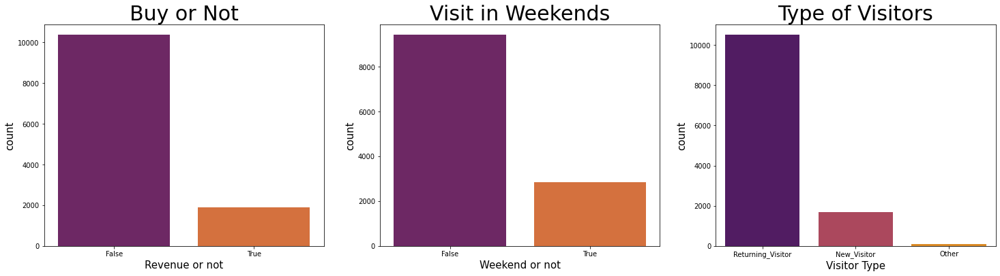

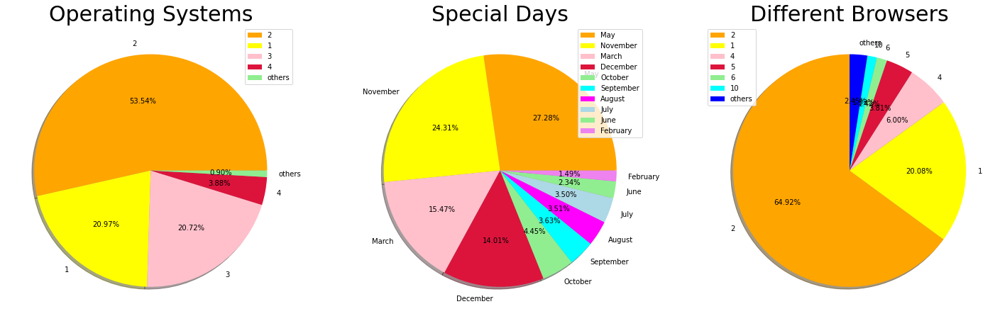

In [8]:
plt.rcParams['figure.figsize'] = (25, 6)
plt.rcParams['figure.subplot.hspace'] = .5

# checking the Distribution of Revenue
plt.subplot(1, 3, 1)
sns.countplot(data['Revenue'], palette = 'inferno')
plt.title('Buy or Not', fontsize = 30)
plt.xlabel('Revenue or not', fontsize = 15)
plt.ylabel('count', fontsize = 15)


# checking the Distribution of customers on Weekend
plt.subplot(1, 3, 2)
sns.countplot(data['Weekend'], palette = 'inferno')
plt.title('Visit in Weekends', fontsize = 30)
plt.xlabel('Weekend or not', fontsize = 15)
plt.ylabel('count', fontsize = 15)

# checking the Distribution of Type of visitors
plt.subplot(1, 3, 3)
sns.countplot(data['VisitorType'], palette = 'inferno')
plt.title('Type of Visitors', fontsize = 30)
plt.xlabel('Visitor Type', fontsize = 15)
plt.ylabel('count', fontsize = 15)
plt.show()

plt.rcParams['figure.figsize'] = (25, 25)
plt.rcParams['figure.subplot.hspace'] = .5
# plotting a pie chart for different number of OSes users have.
plt.subplot(1, 3, 1)
size = [6601, 2585, 2555, 478, 111]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen']
labels = "2", "1","3","4","others"
explode = [0, 0, 0, 0, 0]
circle = plt.Circle((0, 0), 0.6, color = 'white')
plt.subplot(1, 3, 1)
plt.pie(size, colors = colors, labels = labels, explode = explode, shadow = True, autopct = '%.2f%%')
plt.title('Operating Systems', fontsize = 30)
p = plt.gcf()
plt.axis('off')
plt.legend()

# plotting a pie chart for share of special days
plt.subplot(1, 3, 2)
size = [3364, 2998, 1907, 1727, 549, 448, 433, 432, 288, 184]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen', 'cyan', 'magenta', 'lightblue', 'lightgreen', 'violet']
labels = "May", "November", "March", "December", "October", "September", "August", "July", "June", "February"
explode = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
circle = plt.Circle((0, 0), 0.6, color = 'white')
plt.pie(size, colors = colors, labels = labels, explode = explode, shadow = True, autopct = '%.2f%%')
plt.title('Special Days', fontsize = 30)
p = plt.gcf()
plt.axis('off')
plt.legend()

# plotting a pie chart for browsers
plt.subplot(1, 3, 3)
size = [7961, 2462, 736, 467,174, 163, 300]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen', 'cyan', 'blue']
labels = "2", "1","4","5","6","10","others"
plt.subplot(1, 3, 3)
plt.pie(size, colors = colors, labels = labels, shadow = True, autopct = '%.2f%%', startangle = 90)
plt.title('Different Browsers', fontsize = 30)
plt.axis('off')
plt.legend()

plt.show()



## Bivariate Analysis

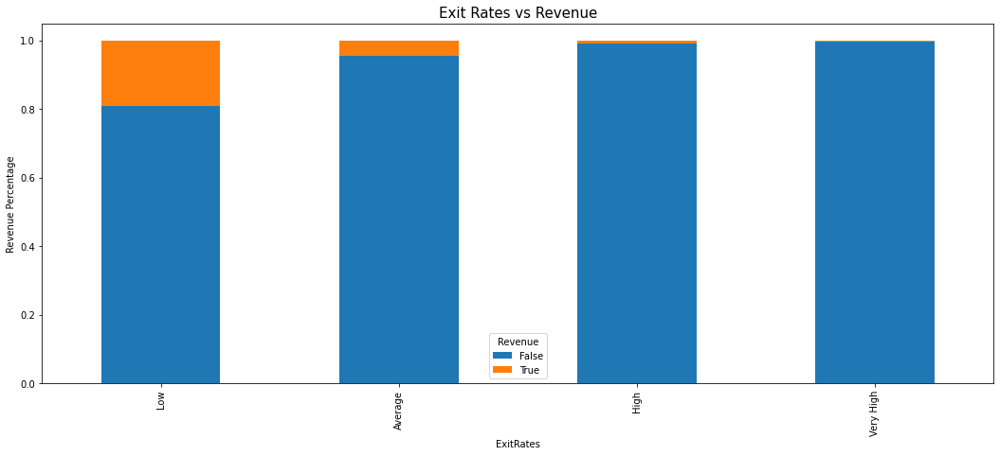

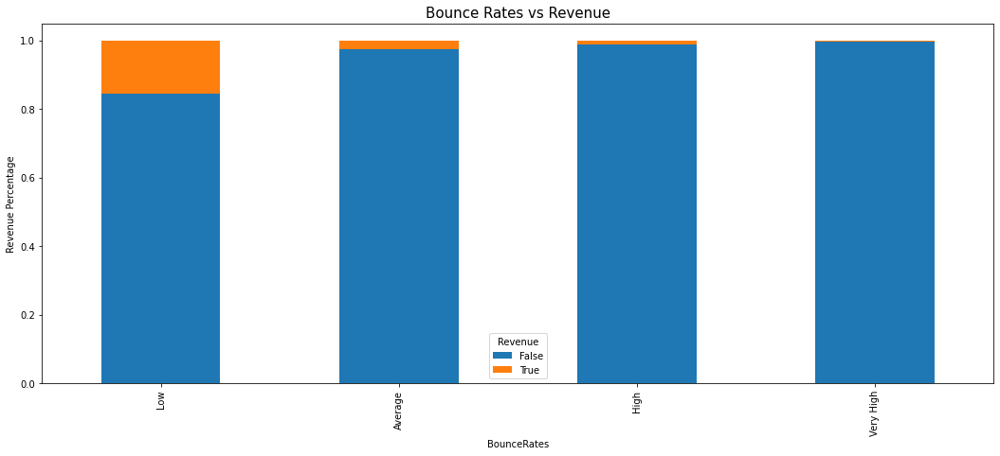

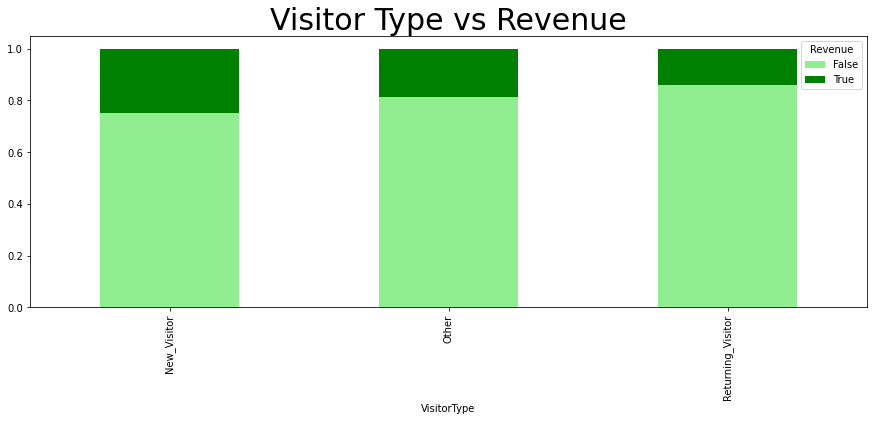

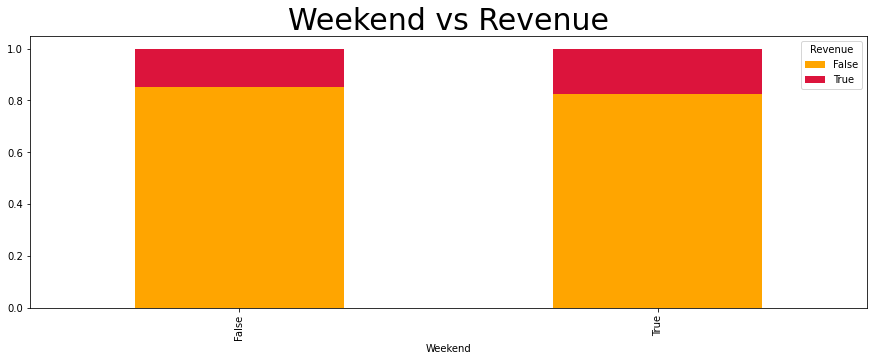

In [9]:
plt.rcParams['figure.figsize'] = (18, 7)

bins=[0,.05,.1,.15,.20] 
group=['Low','Average','High','Very High'] 
data['Exit_Rates_Bin']=pd.cut(data['ExitRates'],bins,labels=group)
df=pd.crosstab(data['Exit_Rates_Bin'],data['Revenue']) 
df.div(df.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True)
plt.title('Exit Rates vs Revenue', fontsize = 15)
plt.xlabel('ExitRates') 
plt.ylabel('Revenue Percentage')
plt.show()
data=data.drop(['Exit_Rates_Bin'], axis=1)

bins=[0,.05,.1,.15,.20] 
group=['Low','Average','High','Very High'] 
data['Bounce_Rates_Bin']=pd.cut(data['BounceRates'],bins,labels=group)
df=pd.crosstab(data['Bounce_Rates_Bin'],data['Revenue']) 
df.div(df.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True)
plt.title('Bounce Rates vs Revenue', fontsize = 15)
plt.xlabel('BounceRates') 
plt.ylabel('Revenue Percentage')
plt.show()
data=data.drop(['Bounce_Rates_Bin'], axis=1)

# visitor type vs revenue

df = pd.crosstab(data['VisitorType'], data['Revenue'])
df.div(df.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['lightgreen', 'green'])
plt.title('Visitor Type vs Revenue', fontsize = 30)
plt.show()

# Weekend vs Revenue

df = pd.crosstab(data['Weekend'], data['Revenue'])
df.div(df.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['orange', 'crimson'])
plt.title('Weekend vs Revenue', fontsize = 30)
plt.show()



## Multivariate Analysis

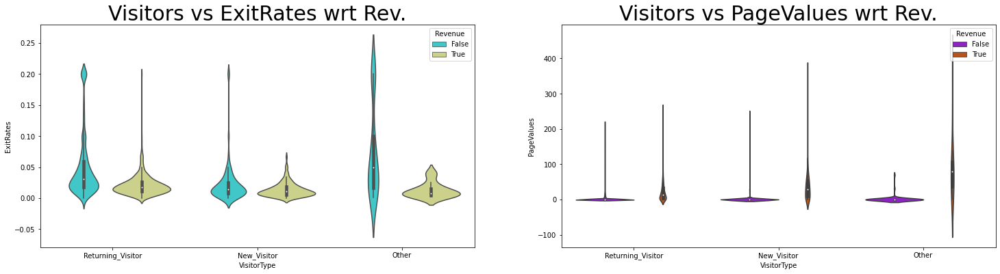

In [10]:
# visitor type vs exit rates w.r.t revenue

plt.rcParams['figure.figsize'] = (25, 15)
plt.subplot(2, 2, 1)
sns.violinplot(x = data['VisitorType'], y = data['ExitRates'], hue = data['Revenue'], palette = 'rainbow')
plt.title('Visitors vs ExitRates wrt Rev.', fontsize = 30)

# visitor type vs exit rates w.r.t revenue
plt.subplot(2, 2, 2)
sns.violinplot(x = data['VisitorType'], y = data['PageValues'], hue = data['Revenue'], palette = 'gnuplot')
plt.title('Visitors vs PageValues wrt Rev.', fontsize = 30)


plt.show()

### Detect and clear outliers 


 Outlier Detection via EDA 
 


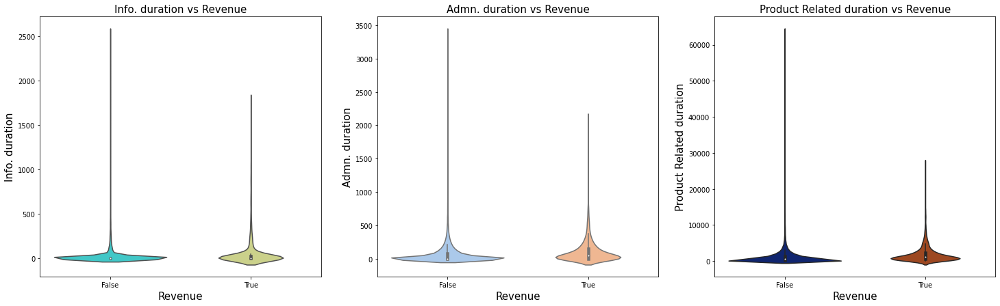


 Post recitificaton of Outlier Detection 



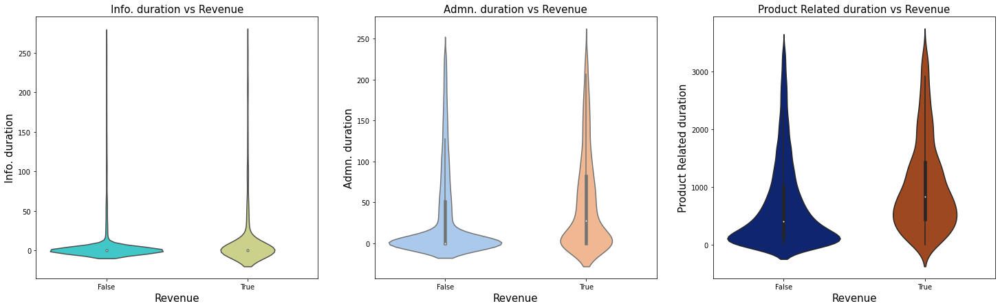

In [11]:
# product related duration vs revenue


print('\n Outlier Detection via EDA \n ')
plt.rcParams['figure.figsize'] = (25, 7)

plt.subplot(1, 3, 1)
sns.violinplot(data['Revenue'], data['Informational_Duration'], palette = 'rainbow')
#sns.boxenplot(data['Revenue'], data['Informational_Duration'], palette = 'rainbow')
plt.title('Info. duration vs Revenue', fontsize = 15)
plt.ylabel('Info. duration', fontsize = 15)
plt.xlabel('Revenue', fontsize = 15)


# product related duration vs revenue

plt.subplot(1, 3, 2)
sns.violinplot(data['Revenue'], data['Administrative_Duration'], palette = 'pastel')
#sns.boxenplot(data['Revenue'], data['Administrative_Duration'], palette = 'pastel')
plt.title('Admn. duration vs Revenue', fontsize = 15)
plt.ylabel('Admn. duration', fontsize = 15)
plt.xlabel('Revenue', fontsize = 15)

# product related duration vs revenue

plt.subplot(1, 3, 3)
sns.violinplot(data['Revenue'], data['ProductRelated_Duration'], palette = 'dark')
#sns.boxenplot(data['Revenue'], data['ProductRelated_Duration'], palette = 'dark')
plt.title('Product Related duration vs Revenue', fontsize = 15)
plt.ylabel('Product Related duration', fontsize = 15)
plt.xlabel('Revenue', fontsize = 15)

plt.show()

# Removing the Outlier
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1


data['ProductRelated_Duration_outlier'] =((data['ProductRelated_Duration'] < (Q1['ProductRelated_Duration'] - 1.5*IQR['ProductRelated_Duration'])) |  
    (data['ProductRelated_Duration'] > (Q3['ProductRelated_Duration'] +  1.5*IQR['ProductRelated_Duration'])))



data['Administrative_Duration_outlier'] =((data['Administrative_Duration'] < (Q1['Administrative_Duration'] - 1.5*IQR['Administrative_Duration'])) |  
    (data['Administrative_Duration'] > (Q3['Administrative_Duration'] +  1.5*IQR['Administrative_Duration'])))

data=data[data['ProductRelated_Duration_outlier']==False]

data=data[data['Administrative_Duration_outlier']==False]

data=data.drop(['ProductRelated_Duration_outlier','Administrative_Duration_outlier'], axis=1)


Q1 = data.Informational_Duration.quantile(0.5)
Q3 = data.Informational_Duration.quantile(0.95)
IQR = Q3 - Q1



data['Informational_Duration_outlier'] =((data['Informational_Duration'] < (Q1 - 1.5*IQR)) |  
   (data['Informational_Duration'] > (Q3 +  1.5*IQR)))

data=data[data['Informational_Duration_outlier']==False]

data=data.drop(['Informational_Duration_outlier'], axis=1)

# Replotting post removal of outlier


print('\n Post recitificaton of Outlier Detection \n')
plt.rcParams['figure.figsize'] = (25, 7)

# product related duration vs revenue
plt.subplot(1, 3, 1)
#sns.boxenplot(data['Revenue'], data['Informational_Duration'], palette = 'rainbow')
sns.violinplot(data['Revenue'], data['Informational_Duration'], palette = 'rainbow')
plt.title('Info. duration vs Revenue', fontsize = 15)
plt.ylabel('Info. duration', fontsize = 15)
plt.xlabel('Revenue', fontsize = 15)

# product related duration vs revenue

plt.subplot(1, 3, 2)
#sns.boxenplot(data['Revenue'], data['Administrative_Duration'], palette = 'pastel')
sns.violinplot(data['Revenue'], data['Administrative_Duration'], palette = 'pastel')
plt.title('Admn. duration vs Revenue', fontsize = 15)
plt.ylabel('Admn. duration', fontsize = 15)
plt.xlabel('Revenue', fontsize = 15)

# product related duration vs revenue

plt.subplot(1, 3, 3)
#sns.boxenplot(data['Revenue'], data['ProductRelated_Duration'], palette = 'dark')
sns.violinplot(x = data['Revenue'], y = data['ProductRelated_Duration'], palette = 'dark')
plt.title('Product Related duration vs Revenue', fontsize = 15)
plt.ylabel('Product Related duration', fontsize = 15)
plt.xlabel('Revenue', fontsize = 15)

plt.show()


## Data Pre-processing

In [12]:

data1 = pd.get_dummies(data)
# label encoding of revenue
le = LabelEncoder()

data['Revenue'] = le.fit_transform(data['Revenue'])
print(data['Revenue'].value_counts())

data['Weekend'] = le.fit_transform(data['Weekend'])
print(data['Weekend'].value_counts())


data1 = pd.get_dummies(data)
data_forFE = data1


0    8839
1    1370
Name: Revenue, dtype: int64
0    7867
1    2342
Name: Weekend, dtype: int64


# **Feature Selection**


In [13]:
# SelectKBest

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
y = data_forFE[['Revenue']]
X = data_forFE.drop(['Revenue'], axis = 1)

#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(28,'Score'))  #print 10 best features

                            Specs          Score
5         ProductRelated_Duration  192527.363135
8                      PageValues  190021.489121
1         Administrative_Duration    9974.452696
3          Informational_Duration    5759.774737
4                  ProductRelated    3539.979266
0                  Administrative     395.206963
25        VisitorType_New_Visitor     159.001804
2                   Informational     110.376325
22                      Month_Nov      95.104055
9                      SpecialDay      35.496862
20                      Month_Mar      31.712034
27  VisitorType_Returning_Visitor      28.392568
21                      Month_May      27.782312
6                     BounceRates      24.347123
7                       ExitRates      23.499316
17                      Month_Feb      21.162831
23                      Month_Oct      18.392639
24                      Month_Sep      17.289381
14                        Weekend      12.241276
11                  

[0.04620596 0.04826953 0.02293672 0.02216679 0.06140877 0.07036782
 0.04690128 0.07114122 0.3583887  0.00584971 0.03198116 0.03264429
 0.04410533 0.04414714 0.01676606 0.00448528 0.00697753 0.00076949
 0.0044582  0.00305914 0.00644406 0.00692939 0.01340888 0.00538763
 0.0053947  0.00962742 0.0005574  0.00922043]


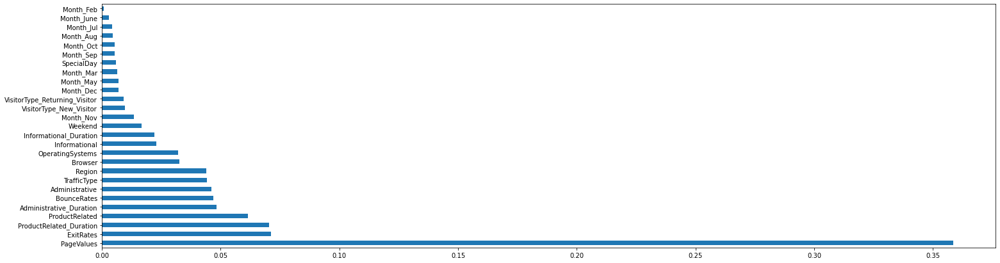

In [14]:
# ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(27).plot(kind='barh')
plt.show()

In [15]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=20) 
principalComponents  = pca.fit_transform(X)
print('Variance ratio for the 1st two components: ', pca.explained_variance_ratio_)

Variance ratio for the 1st two components:  [9.92314443e-01 5.06106986e-03 1.65889009e-03 5.80433531e-04
 3.34797496e-04 2.80776035e-05 9.86133360e-06 5.01576735e-06
 3.49637252e-06 1.32272538e-06 4.74282302e-07 4.43283066e-07
 3.85277846e-07 3.13102550e-07 2.96965789e-07 2.43311547e-07
 1.07402948e-07 6.61331025e-08 5.89456466e-08 5.74578258e-08]


In [16]:
# Selected Features
# Using ExtraTrees Classfier since it gave the best results
columns = feat_importances.nlargest(15).index
print("Selected Features: ", columns)

data1 = data_forFE[columns]

Selected Features:  Index(['PageValues', 'ExitRates', 'ProductRelated_Duration', 'ProductRelated',
       'Administrative_Duration', 'BounceRates', 'Administrative',
       'TrafficType', 'Region', 'Browser', 'OperatingSystems', 'Informational',
       'Informational_Duration', 'Weekend', 'Month_Nov'],
      dtype='object')


In [17]:
# getting dependent and independent variables

x = data1
# removing the target column revenue from x
# x = x.drop(['Revenue'], axis = 1)
y = data['Revenue']

# checking the shapes
print("Shape of x:", x.shape)
print("Shape of y:", y.shape)

#y=y.to_frame()


Shape of x: (10209, 15)
Shape of y: (10209,)


## Splitting the data And Scaling

In [18]:
from sklearn import preprocessing

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

columns_names=x_train.columns
# Create the Scaler object
scaler = preprocessing.MinMaxScaler()
# Fit your data on the scaler object
x_train = scaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train, columns=columns_names)
x_test = scaler.transform(x_test)
x_test = pd.DataFrame(x_test, columns=columns_names)

# checking the shapes
print("Shape of x_train :", x_train.shape)
print("Shape of y_train :", y_train.shape)
print("Shape of x_test :", x_test.shape)
print("Shape of y_test :", y_test.shape)

Shape of x_train : (7146, 15)
Shape of y_train : (7146,)
Shape of x_test : (3063, 15)
Shape of y_test : (3063,)


In [0]:
############################ Model Evaluation #############################

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report


accuracies={}
aucList={}
accuracies_f1={}

def get_score(model_name, x_train, x_test, y_train, y_test, y_pred):
    # evaluating the model
    print('\n#################### Score ####################\n')
    train_score = model.score(x_train, y_train)
    test_score = model.score(x_test, y_test)
    f1_scr = f1_score(y_test, y_pred)
    print("Training Accuracy (Score) : ", train_score)
    print("Testing Accuracy (Score) : ", test_score)
    print("F1 Score : ", f1_scr)
    return train_score, test_score, f1_scr;
    
def get_auc(plt, model_name, x_test, y_test):
    y_pred_quant = model.predict_proba(x_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_quant)
    auc_value = auc(fpr, tpr)
    print('\n Area Under the Curve : ',auc_value)
    fig, ax = plt.subplots()
    ax.plot(fpr, tpr)
    ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="--", c=".3")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.rcParams['font.size'] = 12
    plt.title('ROC curve for '+model_name)
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.grid(True)
    plt.show() 
    return auc_value;


def get_model_evaluate(model_name, x_train, x_test, y_train, y_test, y_pred):
    print('Model Evaluation')
    train_score, test_score, f1_scr = get_score(model_name, x_train, x_test, y_train, y_test, y_pred)
   
    # Classification report
    print('\n################### Classification Matrix ###############\n')
    cr = classification_report(y_test, y_pred)
    print(cr)

    # Confustion matrix
    print('\n################### Confusion Matrix ##################\n')
    cm = confusion_matrix(y_test, y_pred)
    total=sum(sum(cm))    
    accuracy=(cm[0,0]+cm[1,1])/total
    print ('Accuracy : ', accuracy)
    sensitivity = cm[0,0]/(cm[0,0]+cm[0,1])
    print('Sensitivity : ', sensitivity )
    specificity = cm[1,1]/(cm[1,0]+cm[1,1])
    print('Specificity : ', specificity)
    plt.rcParams['figure.figsize'] = (6, 6)
    sns.heatmap(cm ,annot = True) 
    plt.show()   
   


    auc_value=get_auc(plt, model_name, x_test, y_test)
    return train_score, test_score, f1_scr, auc_value;


## Logistic Regression

############  Logistic Regression ############

Model Evaluation

#################### Score ####################

Training Accuracy (Score) :  0.8953260565351245
Testing Accuracy (Score) :  0.8961802154750245
F1 Score :  0.43416370106761565

################### Classification Matrix ###############

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      2650
           1       0.82      0.30      0.43       413

    accuracy                           0.90      3063
   macro avg       0.86      0.64      0.69      3063
weighted avg       0.89      0.90      0.87      3063


################### Confusion Matrix ##################

Accuracy :  0.8961802154750245
Sensitivity :  0.989811320754717
Specificity :  0.29539951573849876


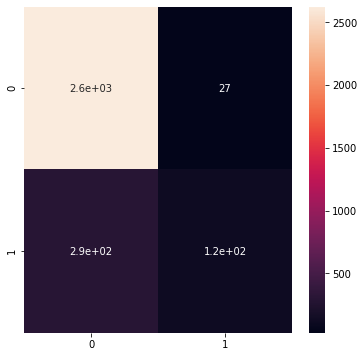


 Area Under the Curve :  0.8868408789803096


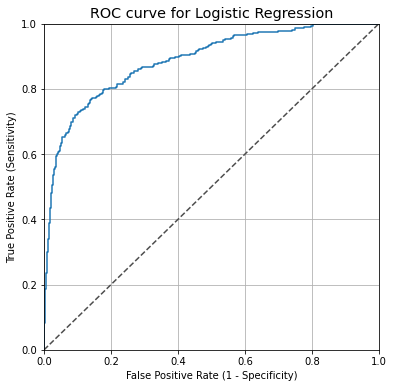

In [20]:
print('############  Logistic Regression ############\n')
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(penalty='l2', tol=1e-4, solver='lbfgs')


tracemalloc.start()
t_start = process_time()
model.fit(x_train, y_train)
t_stop = process_time()
train_current, train_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_train['LR Current'] = train_current/10**6
trace_memory_train['LR Peak'] = train_peak/10**6
time_train['Logistic Regression']=t_stop-t_start

tracemalloc.start()
t_start = process_time()
y_pred = model.predict(x_test)
t_stop = process_time()
test_current, test_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_execution['LR Current'] = test_current/10**6
trace_memory_execution['LR Peak'] = test_peak/10**6
time_execution['Logistic Regression']=t_stop-t_start

train_score, test_score, f1_scr, auc_value = get_model_evaluate('Logistic Regression', x_train, x_test, y_train, y_test, y_pred)
accuracies_f1['Logistic Regression'] = f1_scr
accuracies['Logistic Regression'] = test_score
aucList['Logistic Regression'] = auc_value

## K Nearest Neighbour (KNN)

############  KNeighborsClassifier ############

Model Evaluation

#################### Score ####################

Training Accuracy (Score) :  0.8953260565351245
Testing Accuracy (Score) :  0.8961802154750245
F1 Score :  0.43416370106761565

################### Classification Matrix ###############

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      2650
           1       0.82      0.30      0.43       413

    accuracy                           0.90      3063
   macro avg       0.86      0.64      0.69      3063
weighted avg       0.89      0.90      0.87      3063


################### Confusion Matrix ##################

Accuracy :  0.8961802154750245
Sensitivity :  0.989811320754717
Specificity :  0.29539951573849876


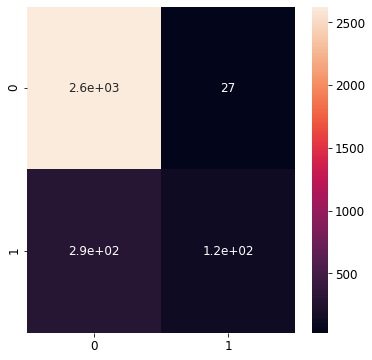


 Area Under the Curve :  0.8868408789803096


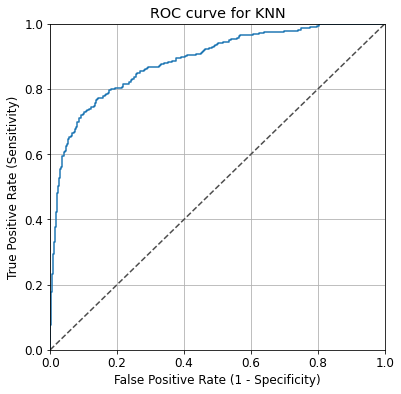

In [21]:
print('############  KNeighborsClassifier ############\n')
from sklearn.neighbors import KNeighborsClassifier

knn2 = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2, weights='uniform')  # n_neighbors means k

tracemalloc.start()
t_start = process_time()
knn2.fit(x_train, y_train)
t_stop = process_time()
train_current, train_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_train['KNN Current'] = train_current/10**6
trace_memory_train['KNN Peak'] = train_peak/10**6
time_train['KNN']=t_stop-t_start

scoreList = []
scoreList.append(knn2.score(x_test, y_test))

tracemalloc.start()
t_start = process_time()
y_pred = model.predict(x_test)
t_stop = process_time()
test_current, test_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_execution['KNN Current'] = test_current/10**6
trace_memory_execution['KNN Peak'] = test_peak/10**6
time_execution['KNN']=t_stop-t_start

train_score, test_score, f1_scr, auc_value = get_model_evaluate('KNN', x_train, x_test, y_train, y_test, y_pred)
accuracies_f1['KNN'] = f1_scr
accuracies['KNN'] = test_score
aucList['KNN'] = auc_value

## Random Forest Classifier

############  RandomForestClassifier ############

Model Evaluation

#################### Score ####################

Training Accuracy (Score) :  0.9927232017912119
Testing Accuracy (Score) :  0.920666013712047
F1 Score :  0.6601398601398601

################### Classification Matrix ###############

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      2650
           1       0.78      0.57      0.66       413

    accuracy                           0.92      3063
   macro avg       0.86      0.77      0.81      3063
weighted avg       0.92      0.92      0.92      3063


################### Confusion Matrix ##################

Accuracy :  0.920666013712047
Sensitivity :  0.9750943396226415
Specificity :  0.5714285714285714


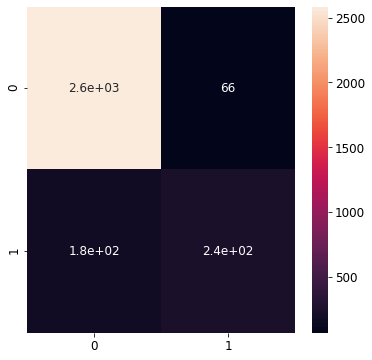


 Area Under the Curve :  0.8940961213394856


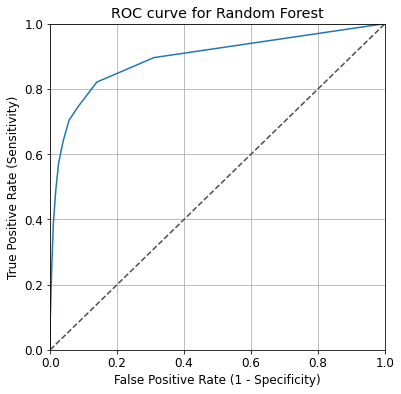

In [22]:
print('############  RandomForestClassifier ############\n')
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=10, criterion="gini", max_features="sqrt", bootstrap=True)

tracemalloc.start()
t_start = process_time()
model.fit(x_train, y_train)
t_stop = process_time()
train_current, train_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_train['RF Current'] = train_current/10**6
trace_memory_train['RF Peak'] = train_peak/10**6
time_train['Random Forest']=t_stop-t_start


tracemalloc.start()
t_start = process_time()
y_pred = model.predict(x_test)
t_stop = process_time()
test_current, test_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_execution['RF Current'] = test_current/10**6
trace_memory_execution['RF Peak'] = test_peak/10**6
time_execution['Random Forest']=t_stop-t_start

train_score, test_score, f1_scr, auc_value = get_model_evaluate('Random Forest', x_train, x_test, y_train, y_test, y_pred)
accuracies_f1['Random Forest'] = f1_scr
accuracies['Random Forest'] = test_score
aucList['Random Forest'] = auc_value

## XGBoost (Bayesian Optimized)

############  XGBClassifier ############

|   iter    |  target   | colsam... |   gamma   | max_de... | max_depth | min_ch... | subsample |
-------------------------------------------------------------------------------------------------
|  1        |  0.8652   |  0.6502   |  7.204    |  0.001144 |  5.023    |  2.935    |  0.4554   |
|  2        |  0.9154   |  0.5118   |  3.456    |  3.968    |  7.388    |  8.384    |  0.8111   |
|  3        |  0.9109   |  0.5227   |  8.781    |  0.2739   |  8.705    |  8.346    |  0.7352   |
|  4        |  0.9194   |  1.0      |  10.0     |  10.0     |  2.0      |  20.0     |  0.4      |
|  5        |  0.9177   |  1.0      |  0.001    |  0.0      |  12.0     |  20.0     |  0.4      |
|  6        |  0.9177   |  1.0      |  10.0     |  10.0     |  12.0     |  0.0      |  0.4      |
|  7        |  0.9154   |  0.4      |  6.102    |  10.0     |  12.0     |  20.0     |  1.0      |
Iteration 0: 
	{'target': 0.8651648710414627, 'params': {'colsample_bytree':

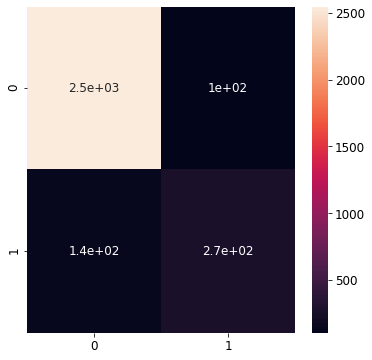


 Area Under the Curve :  0.9187011741057152


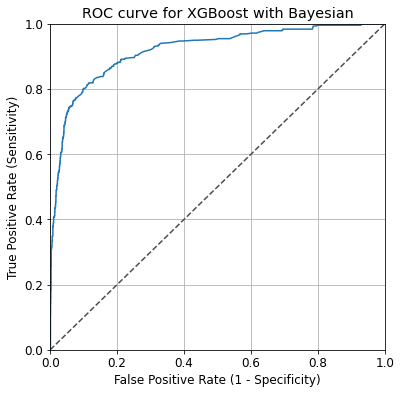

In [23]:
print('############  XGBClassifier ############\n')
from functools import partial
from bayes_opt import BayesianOptimization
from xgboost import XGBClassifier

model = XGBClassifier()     
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


def XGBfit_with(x_train, y_train, x_test, y_test, max_depth, gamma, min_child_weight, max_delta_step, subsample, colsample_bytree):
    model = XGBClassifier(max_depth=int(max_depth), gamma=gamma, min_child_weight=min_child_weight, max_delta_step=max_delta_step, 
                          subsample=subsample, colsample_bytree=colsample_bytree)     
    model.fit(x_train, y_train)
    XGB_pred = model.predict(x_test)

    return accuracy_score(y_test, XGB_pred)

verbose = 1
XGBfit_with_partial = partial(XGBfit_with, x_train, y_train, x_test, y_test)

# Bounded region of parameter space
pbounds = {
    'max_depth': (2, 12),
    'gamma': (0.001, 10.0),
    'min_child_weight': (0, 20),
    'max_delta_step': (0, 10),
    'subsample': (0.4, 1.0),
    'colsample_bytree' :(0.4, 1.0)
}

optimizerXGB = BayesianOptimization(
    f=XGBfit_with_partial,
    pbounds=pbounds,
    verbose=2,  # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

optimizerXGB.maximize(init_points=3, n_iter=4,)
for i, res in enumerate(optimizerXGB.res):
    print("Iteration {}: \n\t{}".format(i, res))
    
model = XGBClassifier(max_depth=int(optimizerXGB.max['params']['max_depth']), gamma=optimizerXGB.max['params']['gamma'],
                      min_child_weight=optimizerXGB.max['params']['min_child_weight'], max_delta_step=optimizerXGB.max['params']['max_delta_step'], 
                          subsample=optimizerXGB.max['params']['subsample'], colsample_bytree=optimizerXGB.max['params']['colsample_bytree'])  
tracemalloc.start()   
t_start = process_time()
training = model.fit(x_train, y_train)
t_stop = process_time()
train_current, train_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_train['XGB Current'] = train_current/10**6
trace_memory_train['XGB Peak'] = train_peak/10**6
time_train['XGBoost with Bayesian']=t_stop-t_start

tracemalloc.start()
t_start = process_time()
y_pred = model.predict(x_test)
t_stop = process_time()
test_current, test_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_execution['XGB Current'] = test_current/10**6
trace_memory_execution['XGB Peak'] = test_peak/10**6
time_execution['XGBoost with Bayesian ']=t_stop-t_start

#Model Evaluation
train_score, test_score, f1_scr, auc_value = get_model_evaluate('XGBoost with Bayesian', x_train, x_test, y_train, y_test, y_pred)
accuracies_f1['XGBoost with Bayesian'] = f1_scr
accuracies['XGBoost with Bayesian'] = test_score
aucList['XGBoost with Bayesian'] = auc_value


In [0]:
# Adding model explainability

import xgboost as xgb #for building models

xgb_model = xgb.train({'objective':'binary:logistic','max_depth':12, 'gamma':10, 'min_child_weight': 0, 'max_delta_step':10, 'subsample':0.4, 'colsample_bytree':1}, xgb.DMatrix(x_train,label=y_train))

#shap package (https://github.com/slundberg/shap)
import shap

# Tree on XGBoost
explainerXGB = shap.TreeExplainer(xgb_model)
shap_values_XGB_train = explainerXGB.shap_values(x_train)
shap_values_XGB_test = explainerXGB.shap_values(x_test)

df_shap_XGB_test = pd.DataFrame(shap_values_XGB_test, columns=x_test.columns)
df_shap_XGB_train = pd.DataFrame(shap_values_XGB_train, columns=x_train.columns)

In [25]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test, x_test)

In [26]:
# 145, 800 -- 1
# 150, 160 -- 0
j = 150
shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test[j], x_test.iloc[[j]],link="logit")

In [0]:
#shap.waterfall_plot(explainerXGB.expected_value, shap_values_XGB_test[j], feature_names=x_test.columns, max_display=5, show=True)

In [28]:
j = 160
shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test[j], x_test.iloc[[j]],link="logit")

In [0]:
#shap.waterfall_plot(explainerXGB.expected_value, shap_values_XGB_test[j], feature_names=x_test.columns, max_display=5, show=True)

In [30]:
j = 800
shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test[j], x_test.iloc[[j]],link="logit")

In [0]:
#shap.waterfall_plot(explainerXGB.expected_value, shap_values_XGB_test[j], feature_names=x_test.columns, max_display=5, show=True)

In [32]:
j = 145
shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test[j], x_test.iloc[[j]],link="logit")


In [0]:
#shap.waterfall_plot(explainerXGB.expected_value, shap_values_XGB_test[j], feature_names=x_test.columns, max_display=5, show=True)

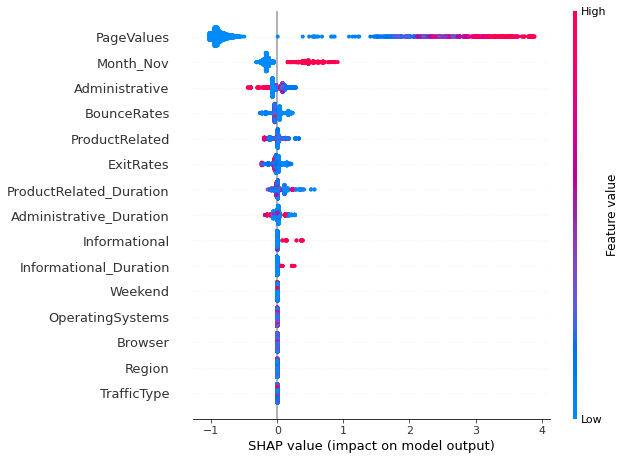

In [34]:
shap.summary_plot(shap_values_XGB_test, x_test)

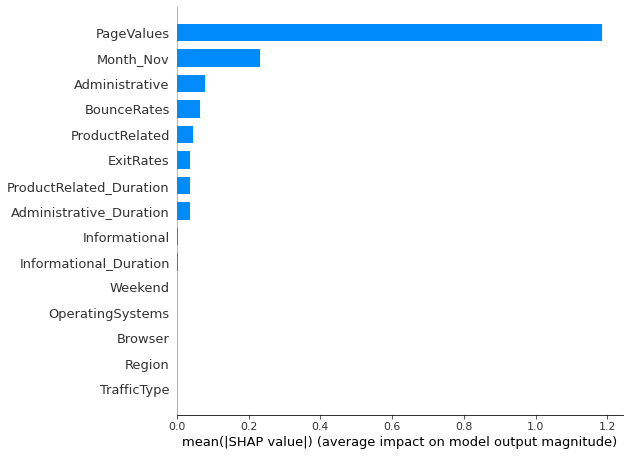

In [35]:
shap.summary_plot(shap_values_XGB_test, x_test, plot_type="bar")

## Multi-layer Perceptron classifier (Bayesian Optimized)

############  MLPClassifier ############

|   iter    |  target   | alpha_xe4 | hidden... | learni... |
-------------------------------------------------------------
|  1        |  0.874    |  42.29    |  7.483    |  0.001011 |
|  2        |  0.9125   |  30.93    |  2.321    |  0.01014  |
|  3        |  0.9141   |  19.44    |  4.11     |  0.04028  |
|  4        |  0.9102   |  100.0    |  1.0      |  0.1      |
|  5        |  0.9105   |  23.23    |  2.686    |  0.08966  |
|  6        |  0.9125   |  1.054    |  1.066    |  0.08572  |
|  7        |  0.8658   |  75.82    |  1.037    |  0.001334 |
Iteration 0: 
	{'target': 0.8739797584067908, 'params': {'alpha_xe4': 42.28517846555483, 'hidden_layers_x10': 7.482920440979423, 'learning_rate': 0.0010113231069171437}}
Iteration 1: 
	{'target': 0.9125040809663728, 'params': {'alpha_xe4': 30.930924690552136, 'hidden_layers_x10': 2.3208030173540175, 'learning_rate': 0.010141520882110983}}
Iteration 2: 
	{'target': 0.9141364675155077, 'params': {'a

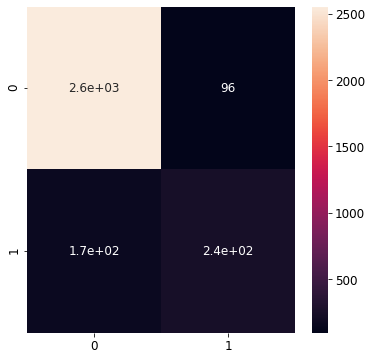


 Area Under the Curve :  0.9142491662478871


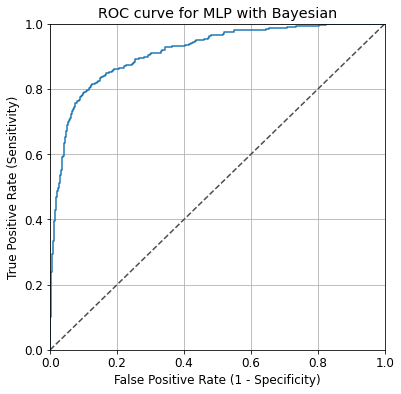

In [36]:
print('############  MLPClassifier ############\n')
from sklearn.neural_network import MLPClassifier

def MLPfit_with(x_train, y_train, x_test, y_test, hidden_layers_x10, alpha_xe4, learning_rate):
    model = MLPClassifier(hidden_layer_sizes=(int(hidden_layers_x10)*10,), max_iter=10, alpha=alpha_xe4*1e-4, 
                          learning_rate_init=learning_rate)
    model.fit(x_train, y_train)
    MLP_pred = model.predict(x_test)

    return accuracy_score(y_test, MLP_pred)

verbose = 1
MLPfit_with_partial = partial(MLPfit_with, x_train, y_train, x_test, y_test)

# Bounded region of parameter space
pbounds = {
    "hidden_layers_x10": (1, 10),
    "alpha_xe4": (1, 100),
    "learning_rate": (0.001, 0.1)
}

optimizerMLP = BayesianOptimization(
    f=MLPfit_with_partial,
    pbounds=pbounds,
    verbose=2,  # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

optimizerMLP.maximize(init_points=3, n_iter=4,)
for i, res in enumerate(optimizerMLP.res):
    print("Iteration {}: \n\t{}".format(i, res))
    
model = MLPClassifier(hidden_layer_sizes=(int(optimizerMLP.max['params']['hidden_layers_x10'])*10,), max_iter=10, alpha=optimizerMLP.max['params']['alpha_xe4']*1e-4, 
                          learning_rate_init=optimizerMLP.max['params']['learning_rate'])
tracemalloc.start()
t_start = process_time()
training = model.fit(x_train, y_train)
t_stop = process_time()
train_current, train_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_train['MLP Current'] = train_current/10**6
trace_memory_train['MLP Peak'] = train_peak/10**6
time_train['MLP with Bayesian']=t_stop-t_start

tracemalloc.start()
t_start = process_time()
y_pred = model.predict(x_test)
t_stop = process_time()
test_current, test_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_execution['MLP Current'] = test_current/10**6
trace_memory_execution['MLP Peak'] = test_peak/10**6
time_execution['MLP with Bayesian']=t_stop-t_start

#Model Evaluation
train_score, test_score, f1_scr, auc_value = get_model_evaluate('MLP with Bayesian', x_train, x_test, y_train, y_test, y_pred)
accuracies_f1['MLP with Bayesian'] = f1_scr
accuracies['MLP with Bayesian'] = test_score
aucList['MLP with Bayesian'] = auc_value


In [37]:
# Adding prediction explainability

import lime
import lime.lime_tabular


explainer = lime.lime_tabular.LimeTabularExplainer(np.array(x_train), feature_names=x_train.columns.values, class_names=training.classes_, discretize_continuous=True)

indexes=[800,145,150,160]
for j in indexes:
  exp = explainer.explain_instance(x_test.iloc[j], training.predict_proba)
  exp.show_in_notebook(show_table=True, show_all=False)

## Hybrid Model

############  Hybrid Model ############

|   iter    |  target   |   knn_w   |   lr_w    |   mlp_w   |   rf_w    |   xgb_w   |
-------------------------------------------------------------------------------------
|  1        |  0.6779   |  1.417    |  1.72     |  8.0      |  4.605    |  8.294    |
|  2        |  0.6788   |  1.092    |  1.186    |  8.691    |  4.794    |  9.078    |
|  3        |  0.678    |  1.419    |  1.685    |  8.409    |  5.756    |  8.055    |
|  4        |  0.6814   |  1.299    |  1.936    |  9.801    |  4.062    |  9.965    |
|  5        |  0.6855   |  1.897    |  1.377    |  9.948    |  5.973    |  9.94     |
|  6        |  0.685    |  1.886    |  1.517    |  8.15     |  5.904    |  9.996    |
|  7        |  0.6675   |  1.019    |  1.782    |  8.007    |  5.926    |  9.957    |
Model Evaluation

#################### Score ####################

Training Accuracy (Score) :  0.9431849986006158
Testing Accuracy (Score) :  0.9193601044727392
F1 Score :  0.675427069

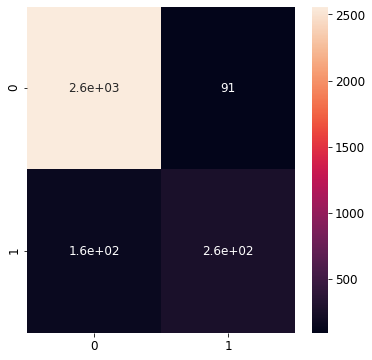


 Area Under the Curve :  0.9274475764082416


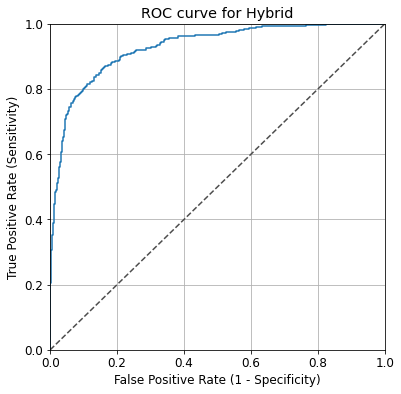

In [38]:
print('############  Hybrid Model ############\n')
from sklearn.ensemble import VotingClassifier

#Models
knn2 = KNeighborsClassifier()
lr = LogisticRegression()
xgb = XGBClassifier(max_depth=int(optimizerXGB.max['params']['max_depth']), gamma=optimizerXGB.max['params']['gamma'],
                      min_child_weight=optimizerXGB.max['params']['min_child_weight'], max_delta_step=optimizerXGB.max['params']['max_delta_step'], 
                          subsample=optimizerXGB.max['params']['subsample'], colsample_bytree=optimizerXGB.max['params']['colsample_bytree'])     
rf = RandomForestClassifier()
mlp = MLPClassifier(hidden_layer_sizes=(int(optimizerMLP.max['params']['hidden_layers_x10'])*10,), max_iter=10, alpha=optimizerMLP.max['params']['alpha_xe4']*1e-4, 
                          learning_rate_init=optimizerMLP.max['params']['learning_rate'])

def hybridfit_with(x_train, y_train, x_test, y_test, rf_w, xgb_w, mlp_w, knn_w, lr_w):
    eclf = VotingClassifier(estimators=[('rf', rf), ('xgb', xgb), ('mlp', mlp), ('knn', knn2), ('lr', lr)], voting='hard', 
                            weights=[rf_w, xgb_w, mlp_w, knn_w, lr_w])
    eclf = eclf.fit(x_train, y_train)
    y_pred = eclf.predict(x_test)
    return f1_score(y_test, y_pred)

verbose = 1
hybridfit_with_partial = partial(hybridfit_with, x_train, y_train, x_test, y_test)

# Bounded region of parameter space
pbounds = {
    "rf_w": (4,6), 
    "xgb_w": (8,10), 
    "mlp_w": (8,10), 
    "knn_w": (1,2), 
    "lr_w": (1,2)
}

optimizer = BayesianOptimization(
    f=hybridfit_with_partial,
    pbounds=pbounds,
    verbose=2,  # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

optimizer.maximize(init_points=3, n_iter=4,)
optimizer.max['params']

# Hybrid Model
model = VotingClassifier(estimators=[('rf', rf), ('xgb', xgb), ('mlp', mlp), ('knn', knn2), ('lr', lr)], voting='soft', 
                        weights=[6,10,8,1,1])
tracemalloc.start()
t_start = process_time()
hybrdmodel_training = model.fit(x_train, y_train)
t_stop = process_time()
train_current, train_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_train['Hybrid Current'] = train_current/10**6
trace_memory_train['Hybrid Peak'] = train_peak/10**6
time_train['Hybrid']=t_stop-t_start

tracemalloc.start()
t_start = process_time()
y_pred = model.predict(x_test)
t_stop = process_time()
test_current, test_peak = tracemalloc.get_traced_memory()
tracemalloc.stop()
trace_memory_execution['Hybrid Current'] = test_current/10**6
trace_memory_execution['Hybrid Peak'] = test_peak/10**6
time_execution['Hybrid']=t_stop-t_start

#Model Evaluation
train_score, test_score, f1_scr, auc_value = get_model_evaluate('Hybrid', x_train, x_test, y_train, y_test, y_pred)
accuracies_f1['Hybrid'] = f1_scr
accuracies['Hybrid'] = test_score
aucList['Hybrid'] = auc_value

# Model Evaluation

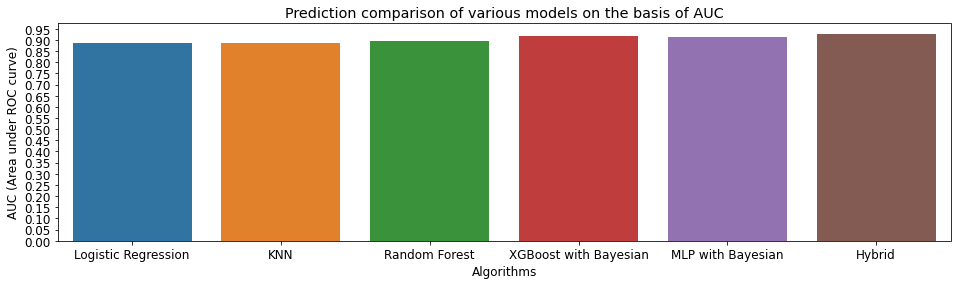

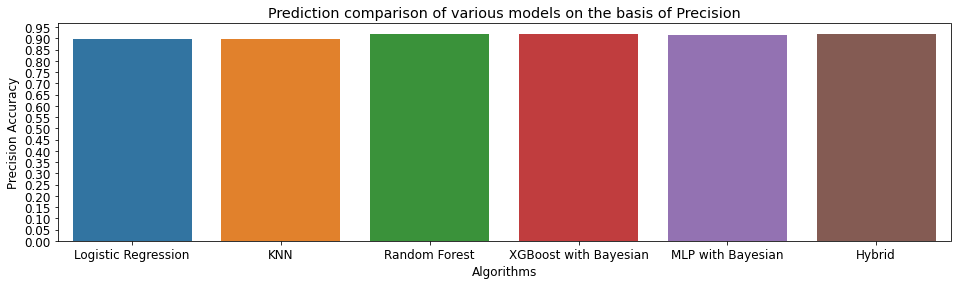

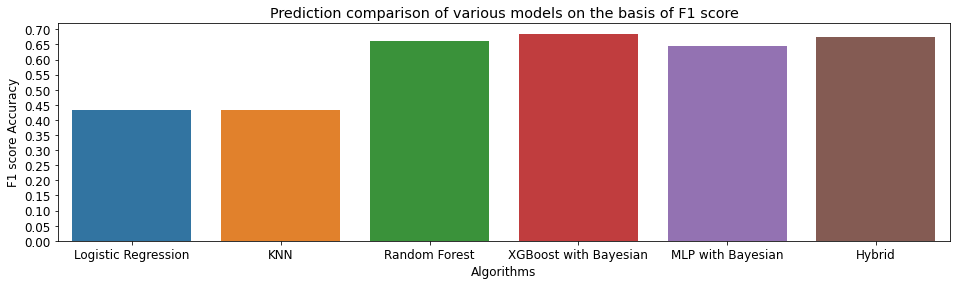

In [39]:
plt.figure(figsize=(16,4))
plt.yticks(np.arange(0,1,.05))
plt.ylabel("AUC (Area under ROC curve)")
plt.title("Prediction comparison of various models on the basis of AUC")
plt.xlabel("Algorithms")
sns.barplot(x=list(aucList.keys()), y=list(aucList.values()))
plt.show()

plt.figure(figsize=(16,4))
plt.yticks(np.arange(0,1,.05))
plt.title("Prediction comparison of various models on the basis of Precision")
plt.ylabel("Precision Accuracy")
plt.xlabel("Algorithms")
sns.barplot(x=list(accuracies.keys()), y=list(accuracies.values()))
plt.show()

plt.figure(figsize=(16,4))
plt.yticks(np.arange(0,1,.05))
plt.title("Prediction comparison of various models on the basis of F1 score")
plt.ylabel("F1 score Accuracy")
plt.xlabel("Algorithms")
sns.barplot(x=list(accuracies_f1.keys()), y=list(accuracies_f1.values()))
plt.show()



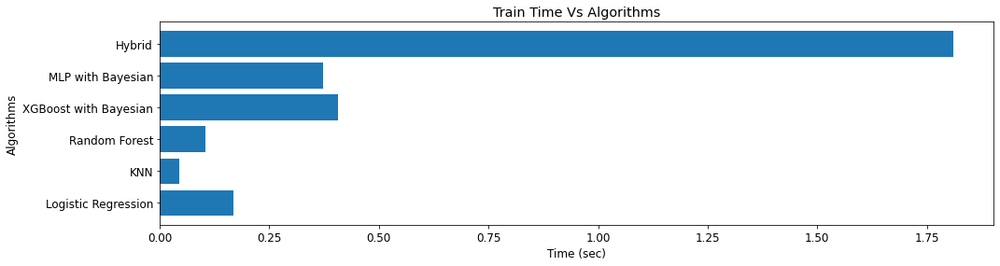

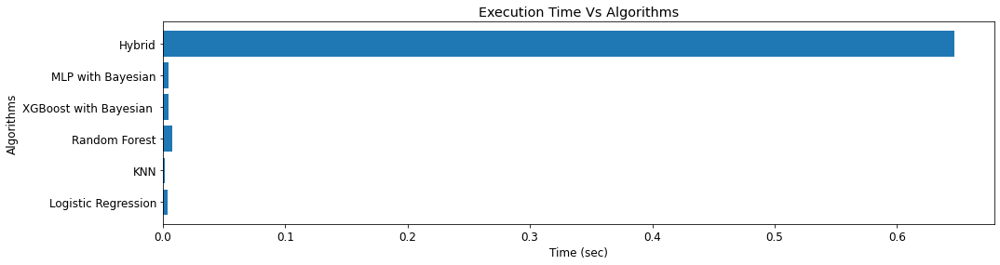

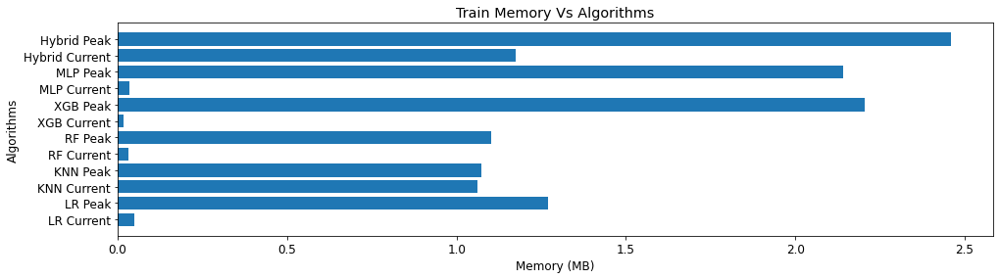

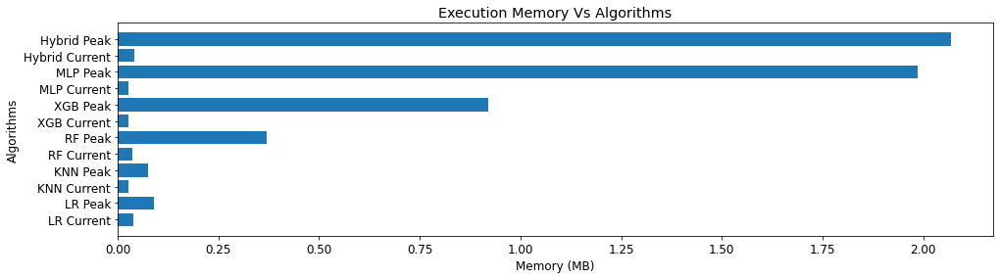

In [40]:
plt.figure(figsize=(16,4))
plt.title("Train Time Vs Algorithms")
plt.xlabel("Time (sec)")
plt.ylabel("Algorithms")
plt.barh(list(time_train.keys()), time_train.values(), align='center')
plt.show()

plt.figure(figsize=(16,4))
plt.title("Execution Time Vs Algorithms")
plt.xlabel("Time (sec)")
plt.ylabel("Algorithms")
plt.barh(list(time_execution.keys()), time_execution.values(), align='center')
plt.show()

plt.figure(figsize=(16,4))
plt.title("Train Memory Vs Algorithms")
plt.xlabel("Memory (MB)")
plt.ylabel("Algorithms")
plt.barh(list(trace_memory_train.keys()), trace_memory_train.values(), align='center')
plt.show()

plt.figure(figsize=(16,4))
plt.title("Execution Memory Vs Algorithms")
plt.xlabel("Memory (MB)")
plt.ylabel("Algorithms")
plt.barh(list(trace_memory_execution.keys()), trace_memory_execution.values(), align='center')
plt.show()    
    